**Task 1 – Load data programmatically (10 points), summarize its statistics (10 points) and report on missing data (10 points). Note that a number of parameters are reported for the same date/time in successive rows.

*Load data programmatically

In [106]:
# Read CSV file from URL given in the assignment 
import pandas as pd
import numpy as np
url = 'https://raw.githubusercontent.com/biplav-s/course-tai/main/sample-code/common-data/water/WaterAtlas-OneLake.csv'
# Load data into Dataframe and print first 5 rows 
csvData = pd.read_csv(url)
csvData.head()

,WBodyID,WaterBodyName,DataSource,StationID,StationName,Actual_StationID,Actual_Latitude,Actual_Longitude,DEP_WBID,SampleDate,...,DepthUnits,Parameter,Characteristic,Sample_Fraction,Result_Value,Result_Unit,QACode,Result_Comment,Original_Result_Value,Original_Result_Unit
0,2003889,Okaloacoochee Branch,WIN_21FLSFWM,32275,CRFW09,32275,26.7629,-81.4001,3235O,5/18/2020 11:11:00 AM,...,m,TN_ugl,Nitrogen,Total,1280.000,ug/l,NaN,NaN,1.280,mg/L
1,2003889,Okaloacoochee Branch,WIN_21FLSFWM,32275,CRFW09,32275,26.7629,-81.4001,3235O,5/18/2020 11:11:00 AM,...,m,NH3_N_ugl,"Nitrogen, ammonia as N",Dissolved,203.000,ug/l,NaN,NaN,0.203,mg/L
2,2003889,Okaloacoochee Branch,WIN_21FLSFWM,32275,CRFW09,32275,26.7629,-81.4001,3235O,5/18/2020 11:11:00 AM,...,m,NOx_ugl,"Nitrogen, Nitrite (NO2) + Nitrate (NO3) as N",Dissolved,9.000,ug/l,I,NaN,0.009,mg/L
3,2003889,Okaloacoochee Branch,WIN_21FLSFWM,32275,CRFW09,32275,26.7629,-81.4001,3235O,5/18/2020 11:11:00 AM,...,m,TP_ugl,Phosphorus as P,Total,52.000,ug/l,NaN,NaN,0.052,mg/L
4,2003889,Okaloacoochee Branch,WIN_21FLSFWM,32275,CRFW09,32275,26.7629,-81.4001,3235O,5/18/2020 11:11:00 AM,...,m,OP_mgl,"Phosphorus, phosphate (PO4) as P",Dissolved,0.002,mg/l,I,NaN,0.002,mg/L


*Data Statistics and Missing data

In [109]:
#Verifying Data types
csvData.dtypes

WBodyID                    int64
WaterBodyName             object
DataSource                object
StationID                 object
StationName               object
Actual_StationID          object
Actual_Latitude          float64
Actual_Longitude         float64
DEP_WBID                  object
SampleDate                object
ActivityDepth            float64
DepthUnits                object
Parameter                 object
Characteristic            object
Sample_Fraction           object
Result_Value             float64
Result_Unit               object
QACode                    object
Result_Comment            object
Original_Result_Value    float64
Original_Result_Unit      object
dtype: object

In [129]:
#Datatype for "SampleDate" field is object and date is not formatted so coverting it into single format
pd.set_option('display.max_rows', 105)
csvData['SampleDate'] = pd.to_datetime(csvData.SampleDate)
csvData['SampleDate'] = csvData['SampleDate'].dt.strftime('%Y-%m-%d %H:%M')
csvData['SampleDate']

0       2020-05-18 11:11
1       2020-05-18 11:11
2       2020-05-18 11:11
3       2020-05-18 11:11
4       2020-05-18 11:11
              ...       
2284    2013-10-16 00:00
2285    2013-10-16 00:00
2286    2013-10-16 00:00
2287    2013-10-16 00:00
2288    2013-10-16 00:00
Name: SampleDate, Length: 2289, dtype: object

In [125]:
#Validating number of rows has null values for various columns in the given data
for column in csvData.columns:
    print(column,csvData[column].isnull().sum())

WBodyID 0
WaterBodyName 0
DataSource 0
StationID 0
StationName 0
Actual_StationID 0
Actual_Latitude 0
Actual_Longitude 0
DEP_WBID 0
SampleDate 0
ActivityDepth 0
DepthUnits 0
Parameter 0
Characteristic 0
Sample_Fraction 554
Result_Value 0
Result_Unit 0
QACode 1961
Result_Comment 1984
Original_Result_Value 110
Original_Result_Unit 110


In [127]:
#Following table shows count for various parameters. Just to verify how many times various parameters are measured in the given dataset
csvData['Parameter'].value_counts()

TP_ugl                   126
DO_mgl                   107
Cond_umhocm              107
pH                       105
TempW_C                  105
TempW_F                  105
OP_mgl                    80
Fe_ugl                    76
NOx_ugl                   73
TN_ugl                    72
Color_true_pcu            68
TKN_ugl                   67
K_mgl                     57
F_mgl                     53
NH3_N_ugl                 50
Cl_diss_mgl               44
Pheo_ugl                  40
Chla_ugl                  40
Secchi_ft                 39
DO_percent                39
Alk_CaCO3_mgl             34
Ca_diss_mgl               32
Na_diss_mgl               32
Hardnesscarbonate_mgl     32
Mg_diss_mgl               31
NH3_N_diss_ugl            29
ChlaC_ugl                 25
Na_mgl                    25
Ca_mgl                    25
TDS_mgl                   25
As_ugl                    25
SO4_mgl                   25
Turb_ntu                  25
TSS_mgl                   25
Cl_mgl        

In [130]:
#Following table shows data grouped by date field
csvData.groupby('SampleDate').count()

,WBodyID,WaterBodyName,DataSource,StationID,StationName,Actual_StationID,Actual_Latitude,Actual_Longitude,DEP_WBID,ActivityDepth,DepthUnits,Parameter,Characteristic,Sample_Fraction,Result_Value,Result_Unit,QACode,Result_Comment,Original_Result_Value,Original_Result_Unit
SampleDate,,,,,,,,,,,,,,,,,,,,
1978-01-11 00:00,28,28,28,28,28,28,28,28,28,28,28,28,28,26,28,28,0,2,26,26
1978-01-20 00:00,20,20,20,20,20,20,20,20,20,20,20,20,20,19,20,20,0,1,19,19
1978-02-08 00:00,29,29,29,29,29,29,29,29,29,29,29,29,29,27,29,29,0,2,27,27
1978-03-08 00:00,26,26,26,26,26,26,26,26,26,26,26,26,26,24,26,26,0,2,24,24
1978-04-04 00:00,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,0,0,2,2
1978-04-05 00:00,20,20,20,20,20,20,20,20,20,20,20,20,20,20,20,20,0,0,20,20
1978-04-19 00:00,22,22,22,22,22,22,22,22,22,22,22,22,22,21,22,22,0,1,21,21
1978-05-03 00:00,25,25,25,25,25,25,25,25,25,25,25,25,25,24,25,25,0,1,24,24
1978-05-17 00:00,25,25,25,25,25,25,25,25,25,25,25,25,25,24,25,25,0,1,24,24


In [117]:
#Creating data frame for "SampleDate", "Parameter" and "Original_Result_Value". This will help to create plots for various parameters, its value and measurement date.
uniqueParameters = csvData['Parameter'].unique()
from collections import OrderedDict
def valuesByDate(x):
    #print(x['Parameter'].unique())
    d = {}
    for index,row in x.iterrows():
        d[row['Parameter']] = row['Original_Result_Value']
    for parameter in uniqueParameters:
        if parameter not in d:
            d[parameter] = np.NaN
    return pd.Series(OrderedDict(sorted(d.items())))


parametersByDate = csvData.groupby('SampleDate').apply(valuesByDate)

In [131]:
#Using describe functions to review statistics on measured values for various parameters.
parametersByDate.describe().T


,count,mean,std,min,25%,50%,75%,max
24D_ugl,5.0,0.070100,1.287810e-01,0.002,0.0085,0.0160,0.0240,0.3000
Ag_ugl,19.0,0.010000,0.000000e+00,0.010,0.0100,0.0100,0.0100,0.0100
Al_ugl,6.0,28.833333,1.355606e+01,11.000,20.2500,30.0000,34.5000,49.0000
Alk_CaCO3_mgl,34.0,230.823529,3.344260e+01,113.000,205.7500,240.0000,250.0000,289.0000
As_ugl,25.0,2.137200,5.009950e-01,1.410,1.7800,2.0800,2.4300,3.4800
BOD5_mgl,1.0,1.000000,NaN,1.000,1.0000,1.0000,1.0000,1.0000
B_ugl,6.0,72.700000,1.040961e+01,57.900,66.9000,73.1000,78.0250,87.6000
Ba_ugl,6.0,18.466667,1.155278e+00,16.900,17.8500,18.5000,18.8500,20.3000
C_organic_mgl,19.0,15.842105,3.905312e+00,10.000,12.5000,15.0000,17.5000,24.0000
Ca_diss_mgl,32.0,92.675312,1.690904e+01,46.570,82.8075,92.7150,106.4375,122.0700


In [133]:
#Using describe function to review statistics on columns having numerical values ('ActivityDepth' and 'Original_Result_Value')
csvData[['ActivityDepth','Original_Result_Value']].describe()

,ActivityDepth,Original_Result_Value
count,2289.000000,2179.000000
mean,0.331355,72.951471
std,0.161500,177.903803
min,0.100000,0.002000
25%,0.152439,0.255000
50%,0.300000,6.000000
75%,0.500000,30.250000
max,0.500000,2240.000000


**Task 2 - Create plots for all the parameters with X-axis showing time and Y-axis showing the parameter value.

In [135]:
paramaterDateFrame = pd.DataFrame(csvData, columns = ['SampleDate','Parameter','Original_Result_Value'])
#paramaterDateFrame['SampleDate'] = pd.to_datetime(paramaterDateFrame.SampleDate)
#paramaterDateFrame['SampleDate'] = paramaterDateFrame['SampleDate'].dt.strftime('%Y-%m-%d %H:%M')
paramaterDateFrame = paramaterDateFrame.sort_values(by=['SampleDate'])
paramaterDateFrame

,SampleDate,Parameter,Original_Result_Value
1380,1978-01-11 00:00,TempW_F,NaN
1365,1978-01-11 00:00,NH3_N_diss_ugl,0.020
1366,1978-01-11 00:00,TKN_ugl,0.440
1367,1978-01-11 00:00,NO3_diss_ugl,0.020
1368,1978-01-11 00:00,NOx_ugl,0.024
...,...,...,...
243,2021-05-03 10:54,TP_ugl,0.062
242,2021-05-03 10:54,NOx_ugl,0.007
240,2021-05-03 10:54,TN_ugl,1.070
244,2021-05-03 10:54,OP_mgl,0.002


/usr/lib/python3/dist-packages/ipykernel_launcher.py:9: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  if __name__ == '__main__':


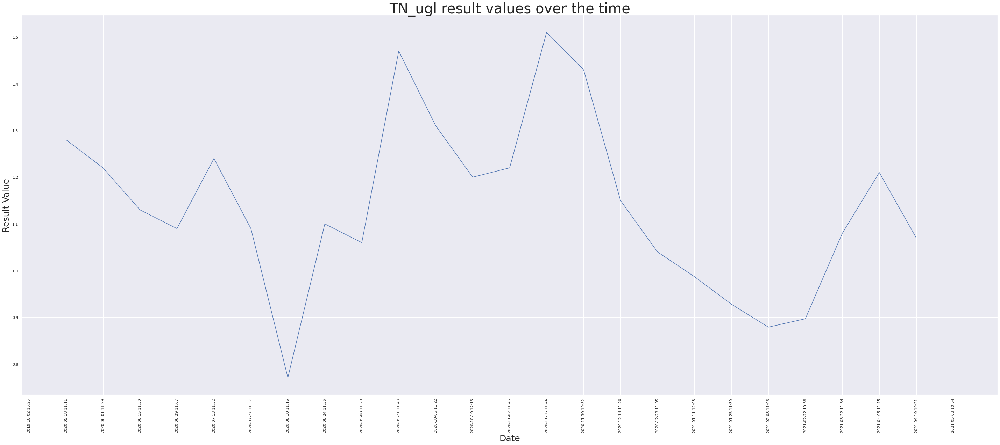

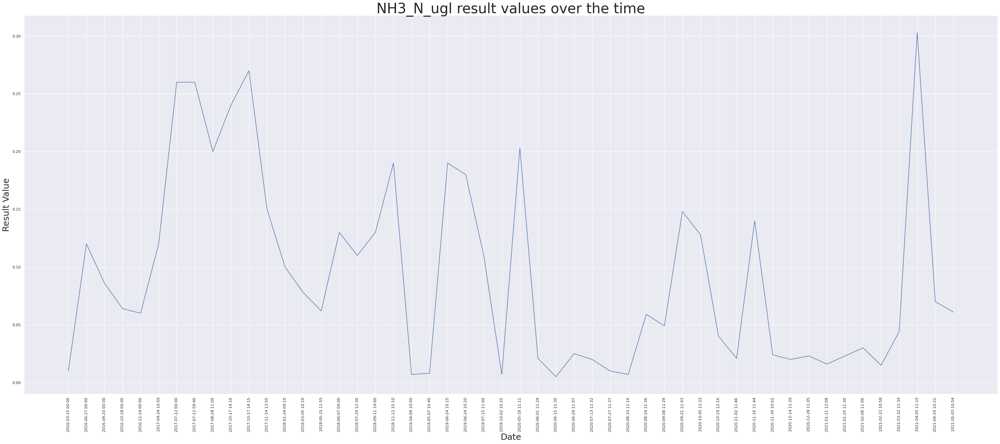

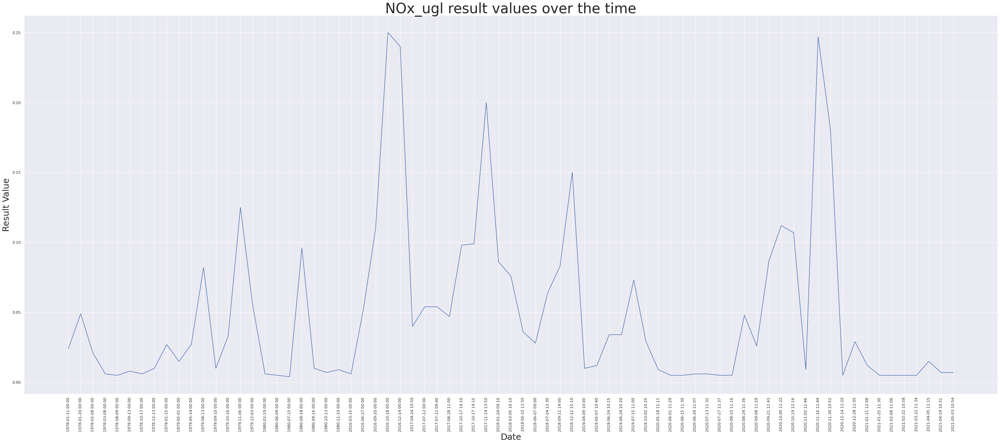

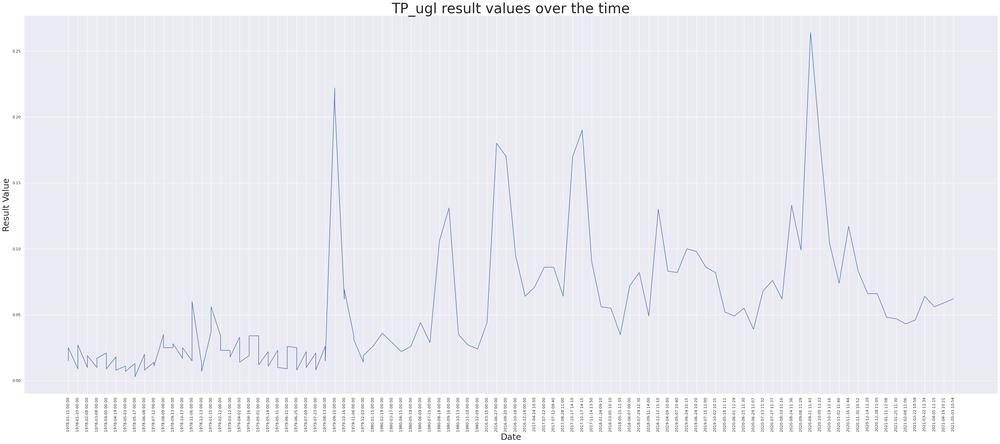

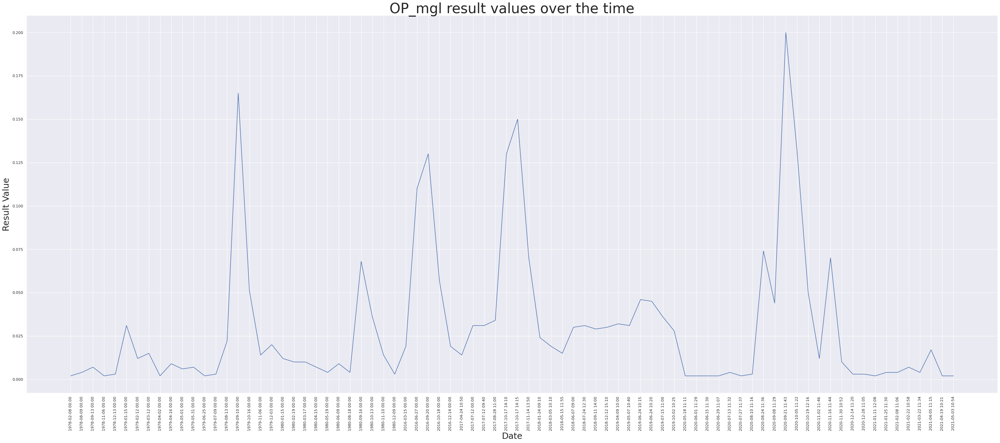

...

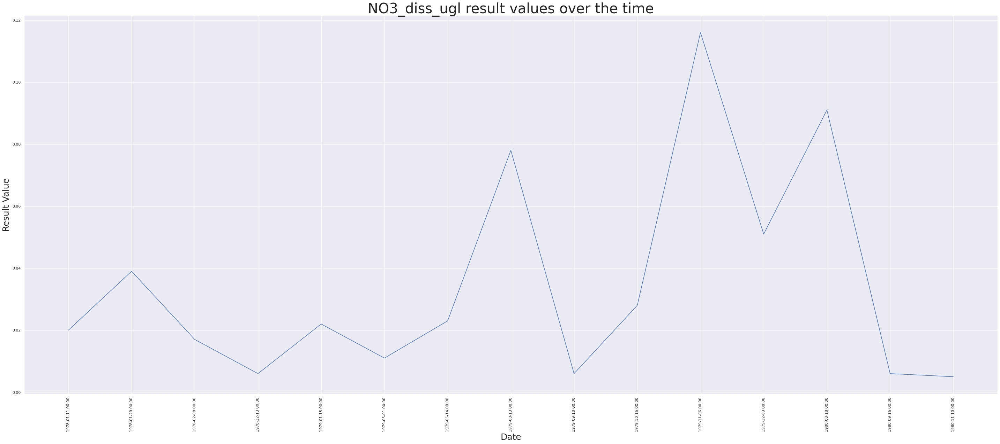

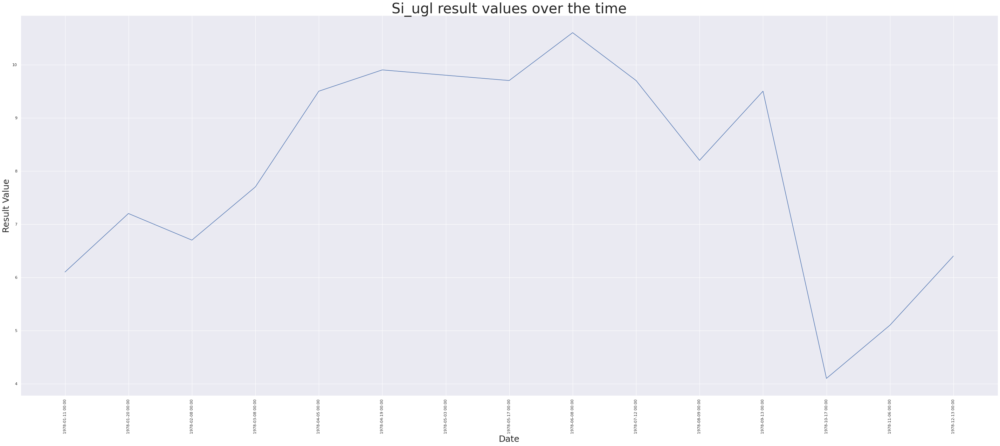

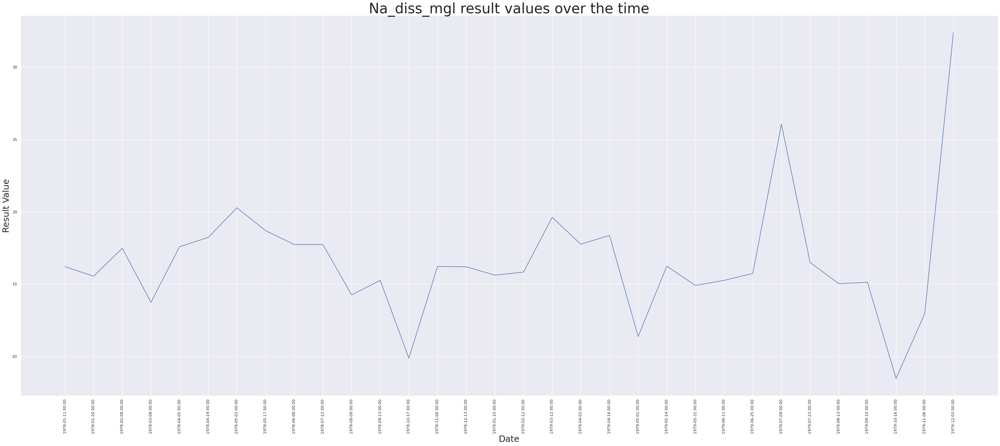

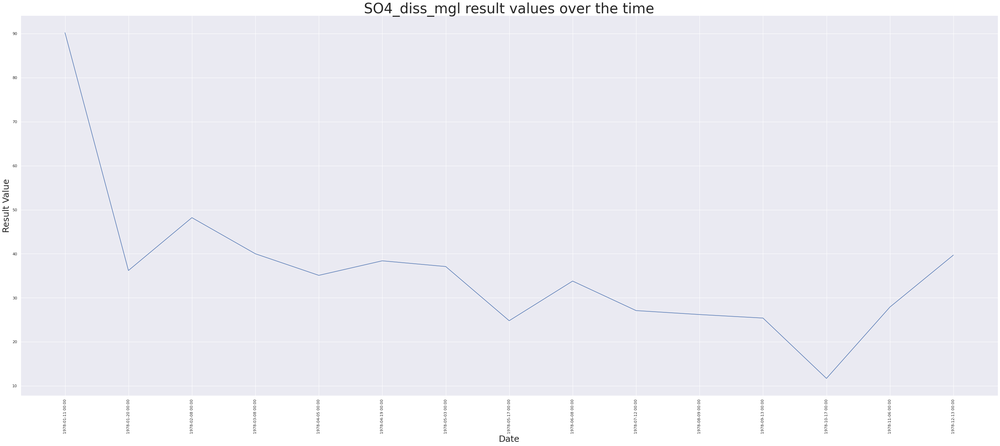

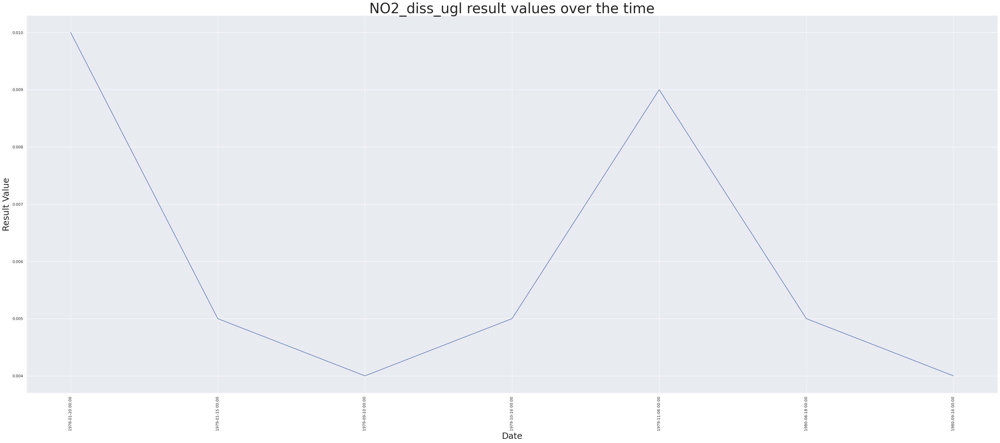

In [136]:
import matplotlib.pyplot as plt

uniqueParameters = csvData['Parameter'].unique()
for parameter in uniqueParameters:
    subsetDataFrame = paramaterDateFrame[paramaterDateFrame['Parameter'] == parameter]
    x_values = subsetDataFrame['SampleDate']
    #subsetDataFrame['Original_Result_Value'].fillna(value=subsetDataFrame['Original_Result_Value'].mean(), inplace=True)
    y_values = subsetDataFrame['Original_Result_Value']
    fig, ax = plt.subplots(figsize=(50, 20))
    ax = plt.gca()
    plt.plot(x_values, y_values) 
    plt.title(parameter+' result values over the time', fontsize=40)
    plt.xlabel('Date', fontsize=25)
    plt.xticks(rotation=90)
    plt.ylabel('Result Value', fontsize=25)

**Task 3 – List at least 3 feature pairs with strong correlations (> 0.5 or <-0.5) among them? Show heatmap of correlation, if possible. What does this indicate?

In [36]:
# using corr functions to review correlation between different fields in the data. Below method will only calculate correlation between fields having numerical values 
corelations = csvData.corr()
corelations

,WBodyID,Actual_Latitude,Actual_Longitude,ActivityDepth,Result_Value,Original_Result_Value
WBodyID,NaN,NaN,NaN,NaN,NaN,NaN
Actual_Latitude,NaN,1.000000,-0.950802,0.874456,0.099274,-0.006243
Actual_Longitude,NaN,-0.950802,1.000000,-0.796486,-0.088886,0.018776
ActivityDepth,NaN,0.874456,-0.796486,1.000000,0.106349,-0.010927
Result_Value,NaN,0.099274,-0.088886,0.106349,1.000000,0.183991
Original_Result_Value,NaN,-0.006243,0.018776,-0.010927,0.183991,1.000000


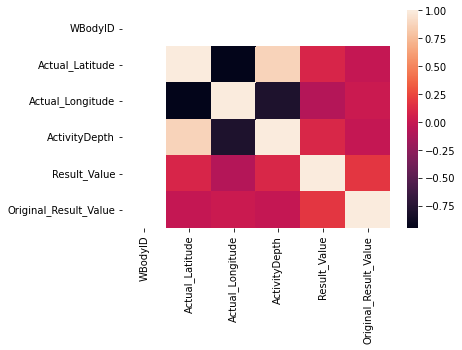

In [34]:
# Using seaborn to plot the heatmap on the calculated correlation values
import seaborn as sns
import matplotlib.pyplot as plt
sns.heatmap(corelations)
plt.show()


In [91]:
#Getting all the columns to use in the following steps.
csvData.columns

Index(['WBodyID', 'WaterBodyName', 'DataSource', 'StationID', 'StationName',
       'Actual_StationID', 'Actual_Latitude', 'Actual_Longitude', 'DEP_WBID',
       'SampleDate', 'ActivityDepth', 'DepthUnits', 'Parameter',
       'Characteristic', 'Sample_Fraction', 'Result_Value', 'Result_Unit',
       'QACode', 'Result_Comment', 'Original_Result_Value',
       'Original_Result_Unit'],
      dtype='object')

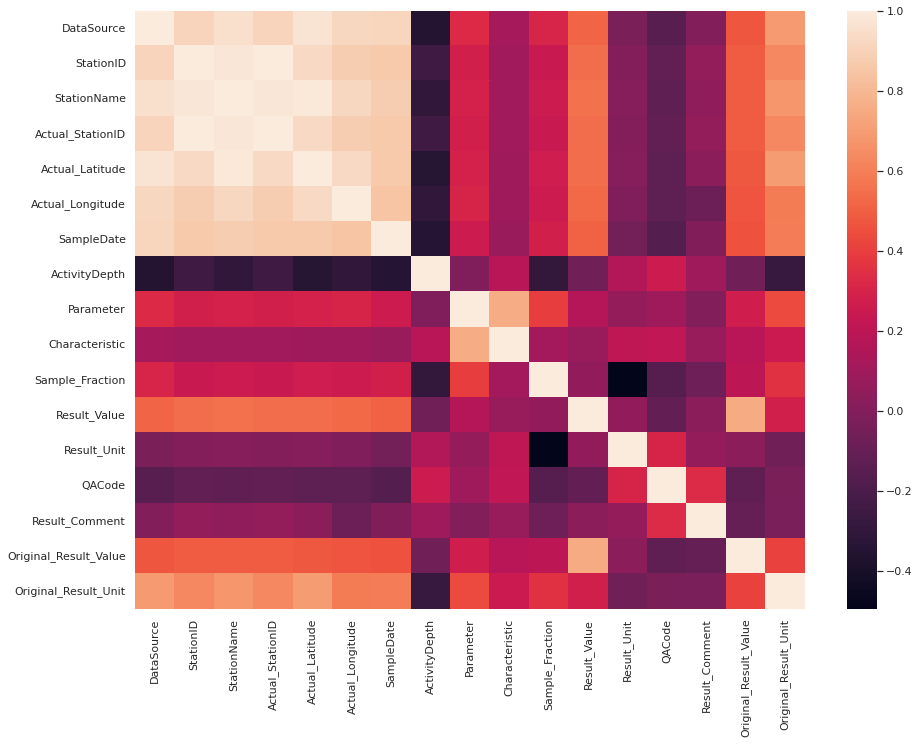

In [150]:
#Selecting some columns where values are not constant and using pearson methods to calculate correlations between various fields in the data
sns.set(rc={'figure.figsize':(15,11)})
csvData_new = csvData[[ 'DataSource', 'StationID', 'StationName',
       'Actual_StationID', 'Actual_Latitude', 'Actual_Longitude',
       'SampleDate', 'ActivityDepth', 'Parameter',
       'Characteristic', 'Sample_Fraction', 'Result_Value', 'Result_Unit',
       'QACode', 'Result_Comment', 'Original_Result_Value',
       'Original_Result_Unit']]
corelations_pearson = csvData_new.apply(lambda x : pd.factorize(x)[0]).corr(method='pearson', min_periods=1)
sns.heatmap(corelations_pearson)
corelations_pearson
plt.show()

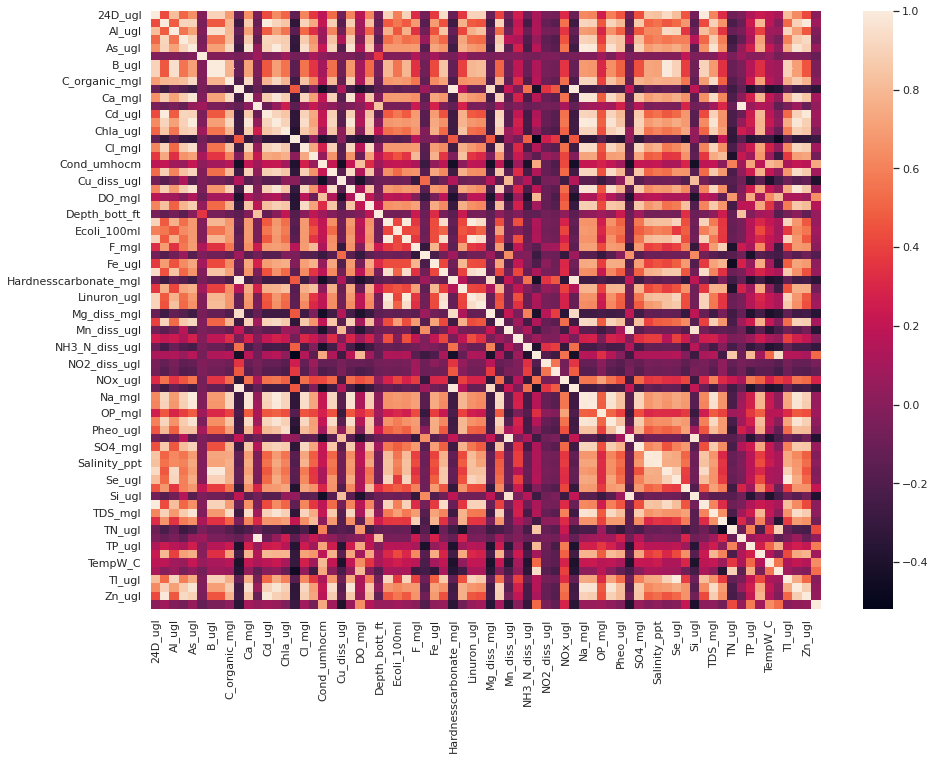

In [149]:
#Using parametersByDate dataframe to calculate correlation between different parameters 
corelations_parameter_measurement = parametersByDate.apply(lambda x : pd.factorize(x)[0]).corr()
sns.heatmap(corelations_parameter_measurement)
plt.show()

In [157]:
#Identifying different fields where correlation is higher than 0.5
for column in corelations_parameter_measurement.columns:
    print(column)
    print(corelations_parameter_measurement[corelations_parameter_measurement[column] > 0.5][column])

24D_ugl
24D_ugl           1.000000
Al_ugl            0.818072
Alk_CaCO3_mgl     0.512400
As_ugl            0.644531
B_ugl             0.900489
Ba_ugl            0.900489
C_organic_mgl     0.692029
Ca_mgl            0.652694
ChlaC_ugl         0.637664
Chla_ugl          0.503124
Cl_mgl            0.619975
Cr_ugl            0.530499
Cu_ugl            0.612614
DO_percent        0.609717
Diuron_ugl        0.900368
Ecoli_100ml       0.595084
Endothall_ugl     0.900368
Glyphosate_ugl    0.946501
Linuron_ugl       0.900368
MCPP_ugl          0.901741
Na_mgl            0.626742
Ni_ugl            0.611459
Pb_ugl            0.590676
Salinity_PSS      0.843073
Salinity_ppt      0.829872
Sb_ugl            0.931673
Se_ugl            0.817715
Sucralose_ug/l    1.000000
TDS_mgl           0.612123
Tl_ugl            0.817715
Turb_ntu          0.637131
Name: 24D_ugl, dtype: float64
Ag_ugl
Ag_ugl            1.000000
Alk_CaCO3_mgl     0.912805
As_ugl            0.904858
C_organic_mgl     0.790842
Ca_mgl    

In [156]:
#Identifying different fields where correlation is less than -0.5
for column in corelations_parameter_measurement.columns:
    print(column)
    print(corelations_parameter_measurement[corelations_parameter_measurement[column] < -0.5][column])

24D_ugl
Series([], Name: 24D_ugl, dtype: float64)
Ag_ugl
Series([], Name: Ag_ugl, dtype: float64)
Al_ugl
Series([], Name: Al_ugl, dtype: float64)
Alk_CaCO3_mgl
Series([], Name: Alk_CaCO3_mgl, dtype: float64)
As_ugl
Series([], Name: As_ugl, dtype: float64)
BOD5_mgl
Series([], Name: BOD5_mgl, dtype: float64)
B_ugl
Series([], Name: B_ugl, dtype: float64)
Ba_ugl
Series([], Name: Ba_ugl, dtype: float64)
C_organic_mgl
Series([], Name: C_organic_mgl, dtype: float64)
Ca_diss_mgl
Series([], Name: Ca_diss_mgl, dtype: float64)
Ca_mgl
Series([], Name: Ca_mgl, dtype: float64)
CarbAlk_mgl
Series([], Name: CarbAlk_mgl, dtype: float64)
Cd_ugl
Series([], Name: Cd_ugl, dtype: float64)
ChlaC_ugl
Series([], Name: ChlaC_ugl, dtype: float64)
Chla_ugl
Series([], Name: Chla_ugl, dtype: float64)
Cl_diss_mgl
NH3_N_ugl   -0.518721
Name: Cl_diss_mgl, dtype: float64
Cl_mgl
Series([], Name: Cl_mgl, dtype: float64)
Color_true_pcu
Series([], Name: Color_true_pcu, dtype: float64)
Cond_umhocm
Series([], Name: Cond_umho

In [158]:
#Identifying different fields where correlation is higher than 0.5
for column in corelations_pearson.columns:
    print(column)
    print(corelations_pearson[corelations_pearson[column] > 0.5][column])

DataSource
DataSource              1.000000
StationID               0.908329
StationName             0.955735
Actual_StationID        0.908329
Actual_Latitude         0.967354
Actual_Longitude        0.923009
SampleDate              0.915322
Result_Value            0.515442
Original_Result_Unit    0.693219
Name: DataSource, dtype: float64
StationID
DataSource              0.908329
StationID               1.000000
StationName             0.981154
Actual_StationID        1.000000
Actual_Latitude         0.928129
Actual_Longitude        0.878650
SampleDate              0.866966
Result_Value            0.542271
Original_Result_Unit    0.629383
Name: StationID, dtype: float64
StationName
DataSource              0.955735
StationID               0.981154
StationName             1.000000
Actual_StationID        0.981154
Actual_Latitude         0.982568
Actual_Longitude        0.918799
SampleDate              0.882419
Result_Value            0.551068
Original_Result_Unit    0.676260
Name: Stati

In [154]:
#Identifying different fields where correlation is less than -0.5
for column in corelations_pearson.columns:
    print(column)
    print(corelations_pearson[corelations_pearson[column] < -0.5][column])

DataSource
Series([], Name: DataSource, dtype: float64)
StationID
Series([], Name: StationID, dtype: float64)
StationName
Series([], Name: StationName, dtype: float64)
Actual_StationID
Series([], Name: Actual_StationID, dtype: float64)
Actual_Latitude
Series([], Name: Actual_Latitude, dtype: float64)
Actual_Longitude
Series([], Name: Actual_Longitude, dtype: float64)
SampleDate
Series([], Name: SampleDate, dtype: float64)
ActivityDepth
Series([], Name: ActivityDepth, dtype: float64)
Parameter
Series([], Name: Parameter, dtype: float64)
Characteristic
Series([], Name: Characteristic, dtype: float64)
Sample_Fraction
Series([], Name: Sample_Fraction, dtype: float64)
Result_Value
Series([], Name: Result_Value, dtype: float64)
Result_Unit
Series([], Name: Result_Unit, dtype: float64)
QACode
Series([], Name: QACode, dtype: float64)
Result_Comment
Series([], Name: Result_Comment, dtype: float64)
Original_Result_Value
Series([], Name: Original_Result_Value, dtype: float64)
Original_Result_Unit

*Below mentioned are the pairs of fields where correlations are greater than 0.5
- DataSource, StationID, StationName, Actual_StationID, Actual_Latitude, Actual_Longitude, SampleDate, Result_Value, Original_Result_Unit    
- Parameter, Characteristic
- Result_Value, Original_Result_Value

There are many different parameters are correlated to eachother (having correlation value > 0.5) but there is single pair having value less than -0.5 whuch is mentioned below.
Cl_diss_mgl, NH3_N_ugl (-0.518721)

**Task 4 – If you are a resident living near this location and looking at this water data. You want to know answers for questions like if it safe to go to swim in the water, use water to irrigate your garden or event drink from it? Can this data answer any such questions? Discuss.

Reference for ideal pH level in swimming pool water
https://www.betterhealth.vic.gov.au/health/healthyliving/swimming-pools-water-quality

Reference for pH level and other parameter measurement for gardening and farming.
https://ag.umass.edu/greenhouse-floriculture/fact-sheets/water-quality-ph-alkalinity#:~:text=In%20general%2C%20water%20for%20irrigation,is%20confused%20with%20%22alkalinity%22.

https://www.blackdogled.com/blogs/education/3-key-steps-to-properly-adjusting-ph-in-your-water-and-nutrient-mix

https://www.hunker.com/13404834/does-the-type-of-water-affect-plant-growth

https://www.cannagardening.com/ph_acidity


Reference for ph level for drinking water
https://www.who.int/water_sanitation_health/dwq/chemicals/ph_revised_2007_clean_version.pdf

*Can this water be used for drinking ? - Based on the various data shown in plot and statistics, people can use the water for drinking purpose as references shows pH value should be between 6.5 to 8.5

*Can this water be used for swimming ? - Ideal pH values for swimming water should be between 7 to 7.6 and pH values are not always in the range in the given data. It's slightly risky to swim in the water. pH > 8 can cause  risk of skin rashes, while a pH < 7 can sting swimmers' eyes.

*Can this water be used for gardening or farming ? Ideal pH values for swimming water should be between 5 to 7 and pH values are in the range of 6.790 to 8.31. Other study shows water with pH values greter than 7 is not immidiately harmful for the plants. To get the accurate answer whether people can use this water for gardening purpose or not, need to review other parameters and see if values of other parameters like alk are good for gardening then people can use this water for gardening purpose.   